# ATM location in New York


## Context
### State of New York

New York is a state located in the northeastern United States. New York was one of the original thirteen colonies that formed the United States. With more than 19 million residents in 2019,[6] it is the fourth most populous state. In order to distinguish the state from its city with the same name which is located within the state, it is sometimes referred to as New York State

https://en.wikipedia.org/wiki/New_York_(state)


### Counties of New York
There are 62 counties in the state of New York. 
The most recent county formation in New York was in 1914, when Bronx County was created from the portions of New York City that had been annexed from Westchester County in the late 19th century and added to New York County.
https://en.wikipedia.org/wiki/List_of_counties_in_New_York




## Introduction/Business Problem

As a newcomer in finance industry, I think cash is has been, but still  want to deploy new ATM structures inside NY state.

I'm looking for places where people are likely to withdraw money AND looking for places where people don't have yet any other good option to do so. 

Using data science, I want to analyze ATM data, understand **where the needs are**. I  want to understand **how my competitors thinks about it**. Given that, I want to find **where to deploy** my new pounds in order to bring the most value out of it.

## Disclaimer
This work will be driven by data, more than any prior knowledge of surrounding context.

As a european who has only seen New york for a few days, I don't know much about how things are organized in US.

I've disovered the "state, county, city" organization during that course and know nothing about the finance industry. 

Data I've found publicly available will drive my analysis, but I'm very aware that someone with closer relation to New-York and/or finance, will have different questions, understanding and expectations.

For the exercise I run into, understanding the context is king, all the machine-leaning in the world will not compensate for that, but yes this is an exercise.

### Question 1: Where are the needs for new ATMs ?

In [1]:
import pandas as pd
import numpy as np
import folium
from geopy.geocoders import Nominatim
import seaborn as sns
from sklearn.cluster import KMeans

#### We will load a geojson files with new york counties and visualize the region

In [2]:
MAP_CENTER=[41, -73.125]
NY_COUNTIES_GEO="https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/new-york-counties.geojson"
map_newyork = folium.Map(location = MAP_CENTER, zoom_start = 6)
map_newyork.choropleth(geo_data = NY_COUNTIES_GEO, 
                   fill_opacity=0.1,
                   line_opacity=1,
                   legend_name = "New York counties")
map_newyork


/home/cedric/miniconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


#### We can now load our ATM csv data, explore, clean and prepare it for our use case

In [3]:
df=pd.read_csv("Bank-Owned_ATM_Locations_in_New_York_State.csv")
df.head()

,Name of Institution,Street Address,City,ZIP Code,County,Location 1
0,Abacus Federal Savings Bank,5518 8th Avenue,Brooklyn,11220.0,Kings,"5518 8th Avenue\nBrooklyn, NY 11220\n(40.63792..."
1,Abacus Federal Savings Bank,36-30 Main Street,Flushing,11354.0,Queens,"36 30 Main Street\nFlushing, NY 11354"
2,Abacus Federal Savings Bank,6-8 Bowery,New York,10013.0,New York,"6 8\nNew York, NY 10013\n(40.73733, -74.00504)"
3,Abacus Federal Savings Bank,104-116 Nassau Street,New York,10038.0,New York,"104 116 Nassau Street\nNew York, NY 10038\n(40..."
4,Access Federal Credit Union,74-76 Main Street,Camden,13316.0,Oneida,"74 76 Main Street\nCamden, NY 13316\n(43.33504..."


- Latitude and longitude information is present in this file however it is not normalized.
- We extract those values from the "Location 1" field and store that in new columns

In [4]:
latlon=df["Location 1"].str.split("\n", n = 3, expand = True)[2].str.replace("(","").str.replace(")","").str.split(",",n=2,expand= True)
df["lat"]=latlon[0]
df["lon"]=latlon[1]

In [5]:
df.head()

,Name of Institution,Street Address,City,ZIP Code,County,Location 1,lat,lon
0,Abacus Federal Savings Bank,5518 8th Avenue,Brooklyn,11220.0,Kings,"5518 8th Avenue\nBrooklyn, NY 11220\n(40.63792...",40.637928,-74.007017
1,Abacus Federal Savings Bank,36-30 Main Street,Flushing,11354.0,Queens,"36 30 Main Street\nFlushing, NY 11354",None,None
2,Abacus Federal Savings Bank,6-8 Bowery,New York,10013.0,New York,"6 8\nNew York, NY 10013\n(40.73733, -74.00504)",40.73733,-74.00504
3,Abacus Federal Savings Bank,104-116 Nassau Street,New York,10038.0,New York,"104 116 Nassau Street\nNew York, NY 10038\n(40...",40.710658,-74.007268
4,Access Federal Credit Union,74-76 Main Street,Camden,13316.0,Oneida,"74 76 Main Street\nCamden, NY 13316\n(43.33504...",43.335045,-75.748044


In [6]:
print(df.shape)
df.dropna(subset = ["lat","lon"]).shape

(5612, 8)


(4688, 8)

In [7]:
df.dropna(subset = ["lat","lon"],inplace=True)

We have extracted latitude and longitude into new columns
- We can use Nominatim to geocode address, this allows us to compare and validate the lat/lon extracted in the CSV with the one obtained from geocoder
- We can also notice that a thousand entries are missing geo coordinates in our CSV data.
- We could try to fill missing values using nominatim... but for our use case we can also drop those values for now

In [8]:
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode("5518 8th Avenue, Brooklyn, NY 11220")
location

Location(5518, 8th Avenue, Sunset Park, South Battery, New York, Brooklyn, Kings County, New York, 11220, United States of America, (40.63804145, -74.00721315000001, 0.0))

#### We can now display all our ATMs on a map to understand how they are distributed across NY state

In [9]:
map_newyork = folium.Map(location = MAP_CENTER, zoom_start = 9)
for lat, lng, name, addr in zip(df['lat'], df['lon'], df['Name of Institution'], df['County']):
    if lat is not None and pd.notna(lat):
        label = '{}, {}'.format(name, addr)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=1,
            popup=label,
            color='blue',
            fill=False,
            fill_color='#3186cc',
            fill_opacity=0.4,
            parse_html=False).add_to(map_newyork)  
map_newyork


Exploring this point cloud we can confirm that ATM locations are all located around New-York state.

Some regions seems to have a much higher density of ATMs that other.

#### We can now combine the state geojson data with our ATM data into a single map
- We count the number of ATMs per county and display that new value on the choropleth map

In [10]:
#County names used in geojson are not the same as the one we have in CSV
#we need to adapt our dataset
#we create the column "County_idx" to be able to join geodata
NY_COUNTIES_GEO_KEY="feature.properties.name"
df["County_idx"]=df["County"].map(str)+" County"
df["County_idx"]=df["County_idx"].replace('Montogomery County','Montgomery County')
count_by_county= df["County_idx"].value_counts().reset_index();
count_by_county.head()

,index,County_idx
0,New York County,626
1,Nassau County,492
2,Suffolk County,425
3,Kings County,373
4,Westchester County,308


In [11]:
map_newyork = folium.Map(location = MAP_CENTER, zoom_start = 6)
map_newyork.choropleth(geo_data = NY_COUNTIES_GEO, 
                   key_on = NY_COUNTIES_GEO_KEY,
                   data =count_by_county, columns = ["index", "County_idx"],
                   fill_opacity=0.9,
                   line_opacity=1,
                   legend_name = "ATM density per county")
# add markers to map
for lat, lng, name, addr in zip(df['lat'], df['lon'], df['Name of Institution'], df['County_idx']):
    if lat is not None and pd.notna(lat):
        label = '{}, {}'.format(name, addr)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=2,
            popup=label,
            color='red',
            fill=True,
            fill_color='#3186cc',
            opacity=0.1,
            parse_html=False).add_to(map_newyork)  
map_newyork


/home/cedric/miniconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


- Many counties have low number of ATMs (in white). 
- Manathan get it's own class with an unusally high amount of ATMs (deep blue)

- The area of a county is probably not relevant for explaining ATM location, many large counties have low number of ATMs.



- Counties with high population should have high number of ATMs.
- That's our next intuition and we will validate that with data.

#### To validate our last assumption, we load a new dataset and assign to each county a value for population

In [12]:
pop = pd.read_html("https://www.newyork-demographics.com/counties_by_population",
                          header=0,
                          attrs={"class":"ranklist"})[0]
pop.drop("Rank",axis=1,inplace=True)
pop.drop(62,axis=0,inplace=True)
pop["Population"]=pd.to_numeric(pop["Population"], errors='raise')
pop.head()

,County,Population
0,Kings County,2600747
1,Queens County,2298513
2,New York County,1632480
3,Suffolk County,1487901
4,Bronx County,1437872


- We merge the new population data into our main dataframe

In [13]:
df.shape

(4688, 9)

In [14]:
df.merge(pop, left_on='County_idx', right_on='County').shape

(4688, 11)

In [15]:
atm_count=df["County_idx"].value_counts().reset_index()
atm_count.rename(columns={'County_idx': 'ATM_count',"index":"County"},inplace=True)
atm_count
dd=atm_count.merge(pop, left_on='County', right_on='County')
dd

,County,ATM_count,Population
0,New York County,626,1632480
1,Nassau County,492,1356564
2,Suffolk County,425,1487901
3,Kings County,373,2600747
4,Westchester County,308,968815
...,...,...,...
57,Lewis County,8,26719
58,Orleans County,7,41175
59,Montgomery County,7,49426
60,Schuyler County,6,17992


#### We suspect a high correlation between the number of ATM in a county and it's population
- one way to verify this is to plot and compare, the frequency distribution for both features.

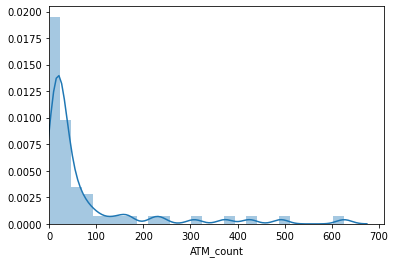

In [16]:
sns.distplot(dd["ATM_count"]).set(xlim=(0));

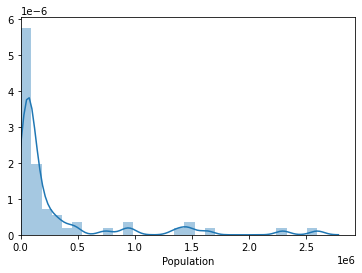

In [17]:
sns.distplot(dd["Population"]).set(xlim=(0));

It seams pretty clear from those charts that both features have a very similar distribution.
- Combining those metrics to get the number of ATM per habitant is probably a good idea.

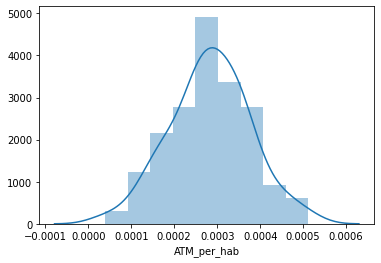

In [18]:
dd["ATM_per_hab"]=dd["ATM_count"]/dd["Population"]
sns.distplot(dd["ATM_per_hab"]);

The distribution we observe here is very close to a gaussian.

In [19]:
1/(dd["ATM_per_hab"].mean())

3527.6218695204057

In [20]:
from sklearn.linear_model import LinearRegression
def test_lin_reg(data):
    sns.regplot(x="Population", y="ATM_count", data=data)
    X = np.array(data["Population"]).reshape(-1, 1)
    y = data["ATM_count"]
    reg = LinearRegression().fit(X, y)
    print("score=",reg.score(X, y))
    print("slope=",reg.coef_[0])
    print("one ATM per {} habitants".format(round(1/reg.coef_[0])))
    data["std_err"]=(data["ATM_count"]-reg.predict(data["Population"].to_numpy().reshape(-1, 1)))**2
    print("outliers",data.sort_values("std_err").tail())

score= 0.629892201249413
slope= 0.0001806332109059001
one ATM per 5536.0 habitants
outliers              County  ATM_count  Population  ATM_per_hab        std_err
8      Bronx County        159     1437872     0.000111   14204.629349
2    Suffolk County        425     1487901     0.000286   18983.307865
1     Nassau County        492     1356564     0.000363   52213.963536
0   New York County        626     1632480     0.000383   97758.874747
11    Queens County         91     2298513     0.000040  117404.583771


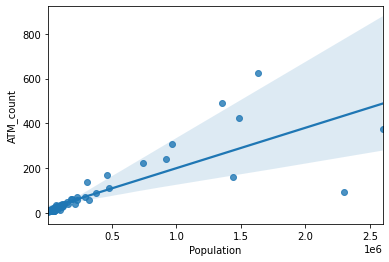

In [21]:
test_lin_reg(dd)

score= 0.790829862100781
slope= 0.00022887350524034925
one ATM per 4369.0 habitants
outliers                County  ATM_count  Population  ATM_per_hab       std_err
4  Westchester County        308      968815     0.000318   5759.003957
1       Nassau County        492     1356564     0.000363  29289.799381
8        Bronx County        159     1437872     0.000111  32568.200283
3        Kings County        373     2600747     0.000143  54111.085355
0     New York County        626     1632480     0.000383  58560.499133


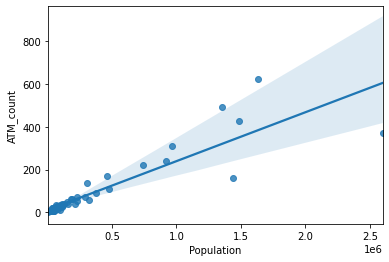

In [22]:
test_lin_reg(pd.DataFrame(dd.loc[dd["County"]!="Queens County"]))

business rule of thumb:
 - **1 ATM for every 4400 habitants** on average in every county
 

Counties on the low tail are where we should build new ATMs

In [23]:
dd.nsmallest(5,"ATM_per_hab")

,County,ATM_count,Population,ATM_per_hab,std_err
11,Queens County,91,2298513,0.000040,117404.583771
50,Putnam County,10,99070,0.000101,694.378974
8,Bronx County,159,1437872,0.000111,14204.629349
59,Montgomery County,7,49426,0.000142,415.495897
3,Kings County,373,2600747,0.000143,13279.570950


On the opposite side those are counties with 'too many ATMs' according to our population rule

In [24]:
dd.nlargest(5,"ATM_per_hab")

,County,ATM_count,Population,ATM_per_hab,std_err
25,Warren County,33,64480,0.000512,8.392790
40,Essex County,18,37751,0.000477,52.923060
38,Allegany County,21,47025,0.000447,35.402692
9,Albany County,137,307426,0.000446,3970.627472
49,Schoharie County,13,31364,0.000414,123.679297


### Next iteration, time to load more data and put things in perspective.



So far we've found a very strong correlation between county population and number of ATMs.

"Queens County", "Putnam County" needs more ATM, and "Warren County" or "Essex County" have too much.

To validate those findings, we would need to improve our data collection, use geocoder on ATMs without location data and find additionnal ATM data sources.

Population is definitely a major feature, but we also need to take more factors into consideration, before investing in new ATMs

- Wealth, crime, mobility, something else ?
- I don't know... I will try wealth, this is exploratory

#### We will look at median household income for each county
- can we observe higher ATM density in wealthier regions ?

In [25]:
wealth = pd.read_html("https://en.wikipedia.org/wiki/List_of_New_York_locations_by_per_capita_income",
                          header=0,
                          attrs={"class":"wikitable sortable"})[0]
wealth.drop("Rank",axis=1,inplace=True)
wealth["County"]=wealth["County"].apply(lambda s: s if(s.endswith("County")) else s+" County" )
wealth["Medianhouseholdincome"]=pd.to_numeric(wealth["Medianhouseholdincome"].str.replace("$","").str.replace(",",""), errors='raise')

In [26]:
ddd=dd.merge(wealth, left_on='County', right_on='County')

In [27]:
ddd.head()

,County,ATM_count,Population_x,ATM_per_hab,std_err,Per capitaincome,Medianhouseholdincome,Medianfamilyincome,Population_y,Number ofhouseholds
0,New York County,626,1632480,0.000383,97758.874747,"$111,386",64971,"$75,629",1585873,763846
1,Nassau County,492,1356564,0.000363,52213.963536,"$41,387",93613,"$107,934",1339532,448528
2,Suffolk County,425,1487901,0.000286,18983.307865,"$35,755",84506,"$96,220",1493350,499922
3,Kings County,373,2600747,0.000143,13279.570950,"$23,605",43567,"$48,777",2504700,916856
4,Westchester County,308,968815,0.000318,13120.350019,"$73,159",79619,"$100,863",949113,347232


In [28]:
ddd.nlargest(5,"Medianhouseholdincome")

,County,ATM_count,Population_x,ATM_per_hab,std_err,Per capitaincome,Medianhouseholdincome,Medianfamilyincome,Population_y,Number ofhouseholds
1,Nassau County,492,1356564,0.000363,52213.963536,"$41,387",93613,"$107,934",1339532,448528
50,Putnam County,10,99070,0.000101,694.378974,"$37,915",89218,"$101,576",99710,35041
2,Suffolk County,425,1487901,0.000286,18983.307865,"$35,755",84506,"$96,220",1493350,499922
17,Rockland County,57,323686,0.000176,396.972984,"$34,304",82534,"$96,836",311687,99242
4,Westchester County,308,968815,0.000318,13120.350019,"$73,159",79619,"$100,863",949113,347232


In [29]:
ddd.nsmallest(5,"Medianhouseholdincome")

,County,ATM_count,Population_x,ATM_per_hab,std_err,Per capitaincome,Medianhouseholdincome,Medianfamilyincome,Population_y,Number ofhouseholds
8,Bronx County,159,1437872,0.000111,14204.629349,"$17,575",34264,"$38,431",1385108,483449
22,Chautauqua County,39,129656,0.000301,8.270910,"$21,033",40639,"$51,031",134905,54244
38,Allegany County,21,47025,0.000447,35.402692,"$20,058",41305,"$49,864",48946,18208
46,Franklin County,13,50692,0.000256,213.522178,"$19,807",42050,"$50,816",51599,19054
29,St. Lawrence County,29,109558,0.000265,85.480245,"$20,143",42303,"$50,384",111944,41605


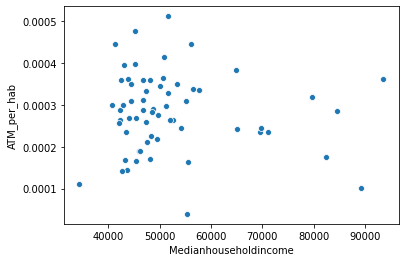

In [30]:
sns.scatterplot(ddd["Medianhouseholdincome"],ddd["ATM_per_hab"])

Somehow disapointing, This looks like totally uncorellated

Median household income doesn't seem to explain why some counties have more or less ATMs than other.


### Conclusion of that first step and summary of findings

When it comes to chosing a location for new ATM:
- consider density of population
- wealth seems irrelevant
- also collect more data and analyze more potential features, such as crimes, cashless habits, ... 


Limitations on that approach:
- we only deal with *location* of ATMs and no performance indication
- we would like to know which one works best (trxs/data, amount/day), but those data are probaly kept secret
- might be safe to assume that long-time underperforming ATMs have been dismantled

### Question 2 Competitors analysis

In competitor analysis we will switch focus to focus on **institution** rather than **county**.

We will try to discover patterns in ATM location for each institution, and understand the strategy they use to choose their ATM locations.

- Does institution-A place ATM location systematically close to restaurant ?
- May be instituion-B ATMs are always placed close transportation service ?

- We will use foursquare API to gather data about suroundings.
- Apply clustering on venues and categories.

If we can understand the strategies that our competitors are using this will give us a great competitive avantage for the future.

We will 
-  use foursquare API to gather data about ATM locations surounding.
-  use clustering algorith on venue data

To avoid going over quotas on foursquare api 
- we will not use our full dataset but use some random samples instead


In [31]:
institution=df.groupby(["Name of Institution"])["County"].nunique()\
.sort_values(ascending=False).head(10).keys().to_list()
institution

['Key Bank, National Association',
 'Manufacturers and Traders Trust Company',
 'Community Bank, N.A.',
 'NBT Bank, National Association',
 'Bank of America N.A. GA1-006-15-40',
 'Citizens Bank',
 'TD Bank N.A.',
 'JPMorgan Chase Bank, National Association',
 'Five Star Bank',
 'Trustco Bank N.A. CTF']

- We want to identify patterns about the institution rather than counties.
- We chose to focus only on biggest 10 institutions that are present in many counties, 

In [32]:
df1 = df.loc[df["Name of Institution"].isin(institution)]\
.groupby(["Name of Institution","County"], group_keys=False)
t=df1.apply(lambda df: df.sample(1)).groupby("Name of Institution").apply(lambda df:df.sample(5))
t

Name of Institution  \
Name of Institution                                                                         
Bank of America N.A. GA1-006-15-40        509          Bank of America N.A. GA1-006-15-40   
                                          282          Bank of America N.A. GA1-006-15-40   
                                          261          Bank of America N.A. GA1-006-15-40   
                                          538          Bank of America N.A. GA1-006-15-40   
                                          499          Bank of America N.A. GA1-006-15-40   
Citizens Bank                             1456                              Citizens Bank   
                                          1421                              Citizens Bank   
                                          1498                              Citizens Bank   
                                          1435                              Citizens Bank   
                                          1443                              Citizens Bank   
Community Bank, N.A.                      1619                       Community Bank, N.A.   
                                          1573                       Community Bank, N.A.   
                                          1570                       Community Bank, N.A.   
                                          1551                       Community Bank, N.A.   
                                          1676                       Community Bank, N.A.   
Five Star Bank                            2058                             Five Star Bank   
                                          2027                             Five Star Bank   
                                          2087                             Five Star Bank   
                                          2068                             Five Star Bank   
                                          2063                             Five Star Bank   
JPMorgan Chase Bank, National Association 2877  JPMorgan Chase Bank, National Association   
                                          2745  JPMorgan Chase Bank, National Association   
                                          2636  JPMorgan Chase Bank, National Association   
                                          2741  JPMorgan Chase Bank, National Association   
                                          2604  JPMorgan Chase Bank, National Association   
Key Bank, National Association            3358             Key Bank, National Association   
                                          3387             Key Bank, National Association   
                                          3385             Key Bank, National Association   
                                          3311             Key Bank, National Association   
                                          3245             Key Bank, National Association   
Manufacturers and Traders Trust Company   3608    Manufacturers and Traders Trust Company   
                                          3729    Manufacturers and Traders Trust Company   
                                          3646    Manufacturers and Traders Trust Company   
                                          3547    Manufacturers and Traders Trust Company   
                                          3510    Manufacturers and Traders Trust Company   
NBT Bank, National Association            3899             NBT Bank, National Association   
                                          3976             NBT Bank, National Association   
                                          3963             NBT Bank, National Association   
                                          3924             NBT Bank, National Association   
                                          3928             NBT Bank, National Association   
TD Bank N.A.                              4977                               TD Bank N.A.   
                                          5001                         

We have selected 5 random ATMs for each institution and additionnaly we choose them so that they are not all located inside the same county.

In [33]:
t["Name of Institution"].value_counts()

Five Star Bank                               5
Manufacturers and Traders Trust Company      5
JPMorgan Chase Bank, National Association    5
Key Bank, National Association               5
Trustco Bank N.A. CTF                        5
Community Bank, N.A.                         5
TD Bank N.A.                                 5
Bank of America N.A. GA1-006-15-40           5
NBT Bank, National Association               5
Citizens Bank                                5
Name: Name of Institution, dtype: int64

#### We visualize those selected ATM on a map

In [34]:
import matplotlib.cm as cm
import matplotlib.colors as colors
map_newyork = folium.Map(location=MAP_CENTER, zoom_start=6)
rainbow = cm.rainbow(np.linspace(0, 1, len(institution)))
rainbowm = dict(zip(institution,rainbow))
for lat, lng, name, addr in zip(t['lat'], t['lon'], t['Name of Institution'], t['County_idx']):
    if lat is not None and pd.notna(lat):
        label = '{}, {}'.format(name, addr)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color=colors.rgb2hex(rainbowm.get(name,[0,0,0])),
            fill=True,
            fill_color=colors.rgb2hex(rainbowm.get(name,[0,0,0])),
            fill_opacity=1,
            parse_html=False).add_to(map_newyork)  
map_newyork


In [35]:
import requests
import requests_cache
import time

requests_cache.install_cache('foursquare_cache', backend='sqlite', expire_after=60*60*24*14)

CLIENT_ID = 'VEOT5G4R5G5NCEH1EIHTGGWJ4PLQLZNINFK3A10IWD3DRH11' # your Foursquare ID
CLIENT_SECRET = '02QISYXURM1GZFWOTNV4ET4LWXEGS2F22EQHU1MUU50Q0I05' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

def explore_url (lat,lon,radius, limit):
    return 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    lat, 
    lon, 
    radius, 
    limit)

def request(url):
    now = time.ctime(int(time.time()))
    response = requests.get(url)
    print("Time: {0} / Used Cache: {1}".format(now, response.from_cache))
    return response.json()

- we use requests_cache to make sure we don't send the same request many times and go over quotas

In [47]:
def getNearbyVenues(atm_id, latitudes, longitudes, radius=500, limit=1000):
    venues_list=[]
    for idx, lat, lng in zip(atm_id, latitudes, longitudes):
        url=explore_url(lat, lng, radius, limit)    
        results = request(url)
        results=results["response"]['groups'][0]['items']
        venues_list.append([(
            idx, 
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['atm_idx','category'] 
    return nearby_venues;

In [48]:
def cat_df(i):
    sample_atms=t.loc[i]
    r=getNearbyVenues(atm_id=sample_atms.index,latitudes=sample_atms['lat'],longitudes=sample_atms['lon'])
    tmp=r.groupby("category").count().reset_index()
    tmp["institution"]=i
    tmp.rename(columns={"atm_idx":"count"},inplace=True)
    return tmp.sort_values("count",ascending=False)
    
all_categories=pd.concat([cat_df(i) for i in institution],ignore_index=True)

Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True
Time: Sun Jun 28 13:53:49 2020 / Used Cache: True


In [52]:
all_categories.sort_values("count",ascending=False)

,category,count,institution
484,Pizza Place,13,"JPMorgan Chase Bank, National Association"
386,American Restaurant,12,TD Bank N.A.
0,Pharmacy,9,"Key Bank, National Association"
139,Pizza Place,9,"Community Bank, N.A."
486,Coffee Shop,8,"JPMorgan Chase Bank, National Association"
...,...,...,...
300,Paper / Office Supplies Store,1,Bank of America N.A. GA1-006-15-40
299,Wings Joint,1,Bank of America N.A. GA1-006-15-40
298,Thrift / Vintage Store,1,Bank of America N.A. GA1-006-15-40
297,Theater,1,Bank of America N.A. GA1-006-15-40


for the 5 selected ATMs that are owned by JPMorgan Chase Bank we have found 13 pizza places in total in the surroundings.

We can try to visualize those categories using a pivot table

In [53]:
pd.pivot_table(all_categories,
               values='count', 
               index=['category'],
               columns=['institution'],
               aggfunc=np.sum, 
               fill_value=0)


institution,Bank of America N.A. GA1-006-15-40,Citizens Bank,"Community Bank, N.A.",Five Star Bank,"JPMorgan Chase Bank, National Association","Key Bank, National Association",Manufacturers and Traders Trust Company,"NBT Bank, National Association",TD Bank N.A.,Trustco Bank N.A. CTF
category,,,,,,,,,,
Accessories Store,0,0,0,1,0,0,0,0,0,0
Afghan Restaurant,0,0,0,0,1,0,0,0,0,0
African Restaurant,0,0,0,0,0,0,0,0,0,1
American Restaurant,7,0,6,5,6,5,3,5,12,4
Art Gallery,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
Wine Shop,0,2,0,0,2,1,0,0,1,0
Wings Joint,1,0,0,0,0,0,0,0,0,0
Women's Store,0,1,0,1,1,0,2,2,0,0


The granularity of categories in foursquare response is way to low, we don't need that level of detail.

Using the foursquare category endpoint we can build a mapping and reduce the dimension of the category feature.


GET https://api.foursquare.com/v2/venues/categories



In [54]:
categories=requests.get('https://api.foursquare.com/v2/venues/categories?&client_id={}&client_secret={}&v={}'\
                        .format(CLIENT_ID,CLIENT_SECRET,VERSION))

[i["name"] for i in categories.json()["response"]["categories"]]

['Arts & Entertainment',
 'College & University',
 'Event',
 'Food',
 'Nightlife Spot',
 'Outdoors & Recreation',
 'Professional & Other Places',
 'Residence',
 'Shop & Service',
 'Travel & Transport']

The top 10 parent categories are great for our use case.


We can use a recursive function to walk though the category tree and build a mapping that convert to parent category

In [55]:
category_mapping={}
        
def load_children(parent,childs):        
    for child in childs:
        if(child["name"] in category_mapping):
            raise Exception('duplicate', child["name"])
        category_mapping[child["name"]]=parent
        if child["categories"]:
            load_children(parent,child["categories"])

for i in categories.json()["response"]["categories"]:
    load_children(i["name"],i["categories"])

category_mapping

{'Amphitheater': 'Arts & Entertainment',
 'Aquarium': 'Arts & Entertainment',
 'Arcade': 'Arts & Entertainment',
 'Art Gallery': 'Arts & Entertainment',
 'Bowling Alley': 'Arts & Entertainment',
 'Casino': 'Arts & Entertainment',
 'Circus': 'Arts & Entertainment',
 'Comedy Club': 'Arts & Entertainment',
 'Concert Hall': 'Arts & Entertainment',
 'Country Dance Club': 'Arts & Entertainment',
 'Disc Golf': 'Arts & Entertainment',
 'Exhibit': 'Arts & Entertainment',
 'General Entertainment': 'Arts & Entertainment',
 'Go Kart Track': 'Arts & Entertainment',
 'Historic Site': 'Arts & Entertainment',
 'Karaoke Box': 'Arts & Entertainment',
 'Laser Tag': 'Arts & Entertainment',
 'Memorial Site': 'Arts & Entertainment',
 'Mini Golf': 'Arts & Entertainment',
 'Movie Theater': 'Arts & Entertainment',
 'Drive-in Theater': 'Arts & Entertainment',
 'Indie Movie Theater': 'Arts & Entertainment',
 'Multiplex': 'Arts & Entertainment',
 'Museum': 'Arts & Entertainment',
 'Art Museum': 'Arts & Entertainm

In [58]:
all_categories["parent_category"]=all_categories["category"].apply(lambda c:category_mapping.get(c,"na"))
pivot=pd.pivot_table(all_categories,
               values='count', 
               index=['parent_category'],
               columns=['institution'],
               aggfunc=np.sum, 
               fill_value=0)
pivot

institution,Bank of America N.A. GA1-006-15-40,Citizens Bank,"Community Bank, N.A.",Five Star Bank,"JPMorgan Chase Bank, National Association","Key Bank, National Association",Manufacturers and Traders Trust Company,"NBT Bank, National Association",TD Bank N.A.,Trustco Bank N.A. CTF
parent_category,,,,,,,,,,
Arts & Entertainment,8,0,4,1,2,5,6,4,5,4
Food,64,37,42,26,104,72,35,65,109,44
Nightlife Spot,9,3,12,3,8,16,5,9,10,3
Outdoors & Recreation,13,3,8,4,8,5,6,3,12,2
Professional & Other Places,2,0,1,2,2,0,0,0,2,0
Residence,0,0,0,0,0,1,0,0,1,0
Shop & Service,30,66,24,45,45,51,43,44,45,27
Travel & Transport,9,2,6,2,3,6,5,2,9,3
na,0,0,0,0,0,0,0,0,0,1


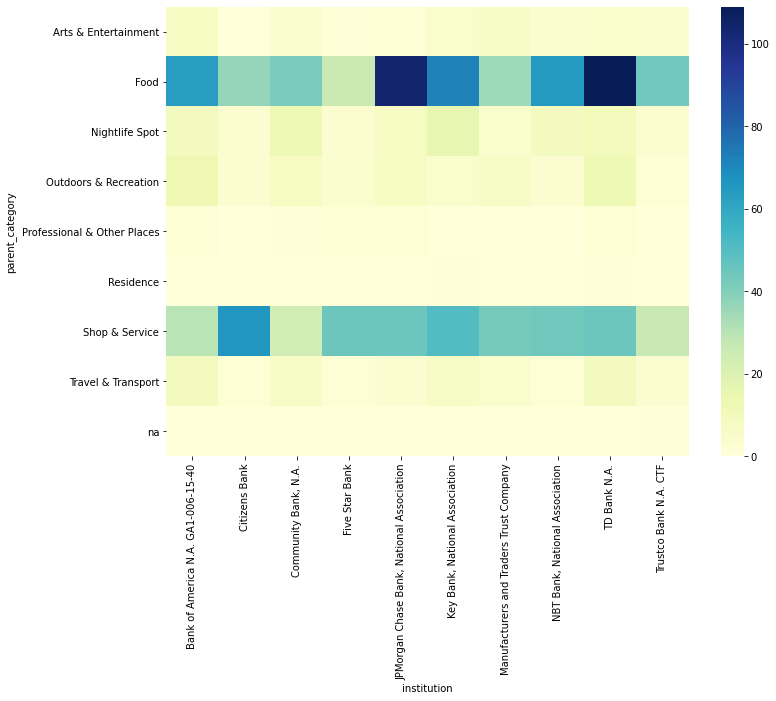

In [59]:
from matplotlib import pyplot
import seaborn
a4_dims = (11.7, 8.27)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=pivot, cmap="YlGnBu")


- Reducing the dimension of categories makes our data more readable
- Venues in category "Food" and "Shop & Service" are the most common in the neighbourhood of ATMs.
- Unfortunately we cannot identify any "institution specific pattern" using that heatmap



#### Next steps:

- Given our last observations running a clustering algorithm on foursquare data is unlikely to provide us with meaningfull insights.
- Further effort should be put in improving our data collection and data cleanup
- We need to experiment with new sources to identify more potentially meaningfull features.
